# Pipeline

See [usage](https://among.github.io/fusus/use/).

See [example](https://github.com/among/fusus/blob/master/example/doExample.ipynb).

How to read this notebook:

1.  *best experience*
    get this repository on your computer and run `jupyter lab`.
    Also install the table of contents extension in Jupyter Lab, since this is a lengthy notebook
    You can run the code cells now.
1.  *good reading experience*
    read it on [NbViewer](https://nbviewer.jupyter.org/github/among/fusus/blob/master/example/doExample.ipynb)
1.  *suboptimal*
    read it directly on [GitHub](https://github.com/among/fusus/blob/master/example/doExample.ipynb)
    (long time to load)

# The beginning

Enable autoloading of changed code.

Change the directory to where this notebook resides on disk, i.e. near the book's scanned pages directory.

In [2]:
%load_ext autoreload
%autoreload 2
!cd `pwd`

Import the fusus package.

See [install](https://among.github.io/fusus/about/install.html).

In [3]:
from fusus.book import Book

Initialize the processing line.

In [4]:
B = Book()

  0.04s Loading for Kraken: ~/github/among/fusus/model/arabic_generalized.mlmodel
  1.12s model loaded


Show the line division in every block of text in every page.
Check visually whether all lines have been detected correctly.

The `layout` stage shows the blocks that have been detected on the page.
In each block the main line bands are shown.
A green rule marks the start of a band, a red rule the end.
The space between bands is greyed out.
We show the `main` bands, which are derived directly from the histogram.

The main bands may not contain *all* the ink, but do not worry: the bands are used to target
the cleaning of marks, and are not visible to the rest of the processing stages.

Check in particular:
* whether short lines have been detected
* whether consecutive lines are not treated as one line.

Page 101 is a critical page: both errors are likely to occur!

In [5]:
def size(pg):
    return dict(sizeW=0.5 if pg == 999 else None, sizeH=0.1 if pg == 999 else None)


def checkLines(pg, quiet=True, **kwargs):
    if pg is None:
        for pg in B.allPagesList:
            page = B.process(
                batch=False,
                pages=pg,
                doOcr=False,
                uptoLayout=True,
                quiet=quiet,
                **size(pg),
                **kwargs,
            )
            page.show(stage="histogram")
    else:
        page = B.process(
            batch=False,
            pages=pg,
            doOcr=False,
            uptoLayout=True,
            quiet=quiet,
            **size(pg),
            **kwargs,
        )
        page.show(stage="histogram")
    return page

In [6]:
B.configure(blurY=None, peakSignificant=0.1, peakProminenceY=None, valleyProminenceY=None, debug=0)

  0.00s Batch of 1 pages: 132
  0.00s Start batch processing images
   |      |      |    -0.00s     1 132.jpg                                 
  1.05s all done
{'demargined', 'orig', 'gray', 'demarginedC', 'normalizedC', 'normalized', 'histogram', 'rotated', 'layout'}


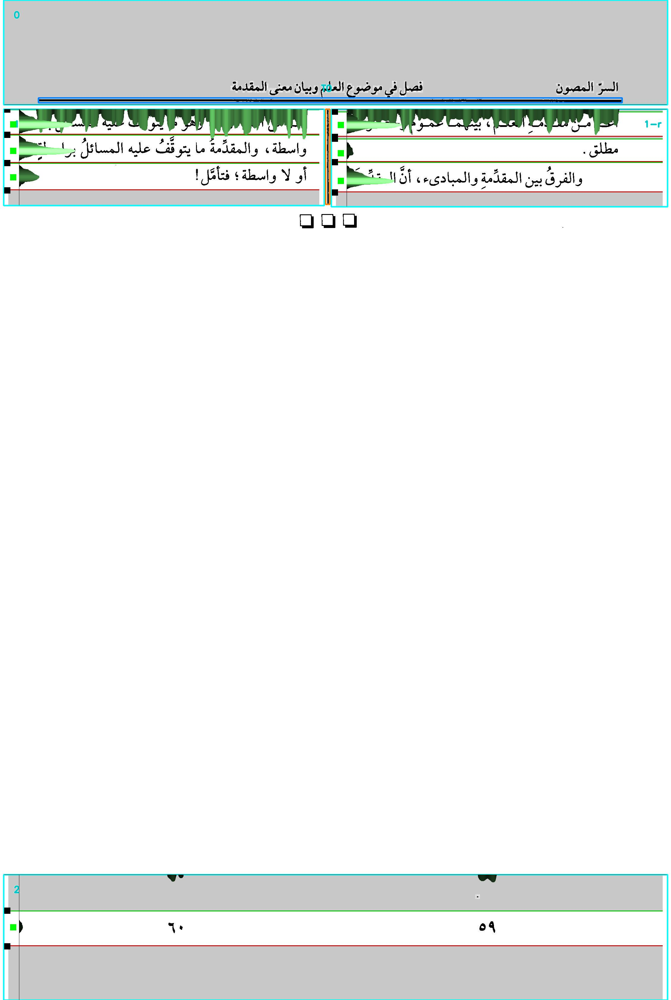

In [7]:
page = checkLines(132)

Page 999 is a small fraction of a page.
We need to specify that, otherwise several parameters get a wrong estimation.
The code above passes the right fraction:

  0.00s Batch of 1 pages: 999
  0.00s Start batch processing images
   |      |      |    2h 03m 13s     1 999.jpg                                 
  0.13s all done
  0.13s all done


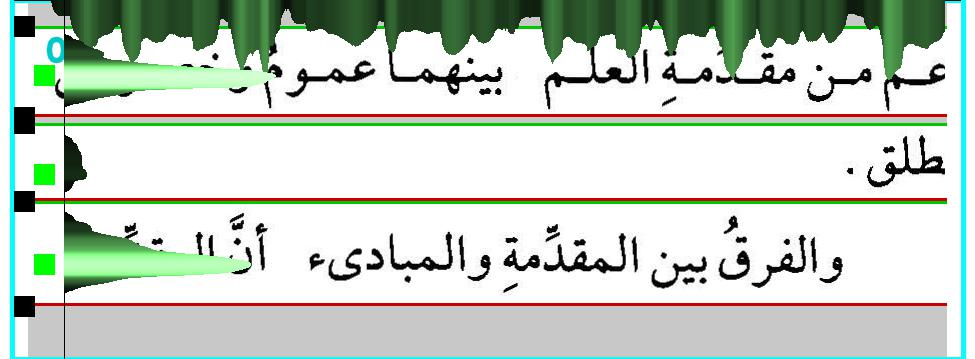

In [210]:
page = checkLines(999)

But if we pass the page as `"999"` no fraction information is passed on, and the results are disastrous.

  0.00s Batch of 1 pages: 999
  0.00s Start batch processing images
   |      |      |    2h 03m 55s     1 999.jpg                                 
  0.23s all done
  0.23s all done


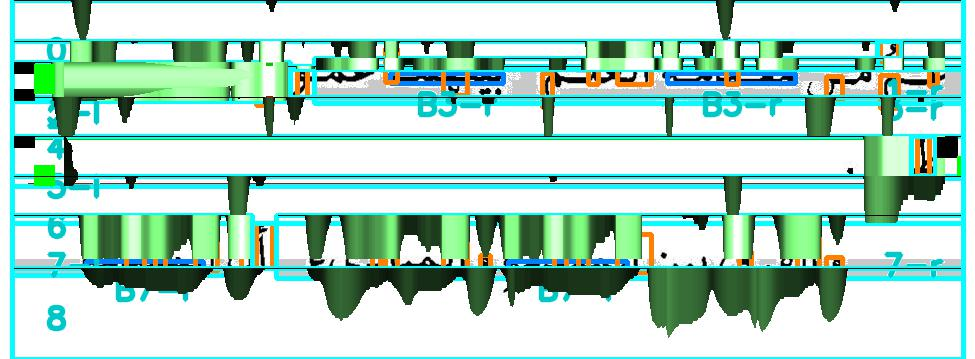

In [211]:
page = checkLines("999")

We check a sample of varied page layouts.

Observe that columns are detected and that all lines are detected:

* lines are not fragmented into narrower bands
* consecutive lines are not taken together

  0.00s Batch of 1 pages: 47
  0.00s Start batch processing images
   |      |      |    2h 05m 26s     1 047.tif                                 
  0.86s all done
  0.86s all done


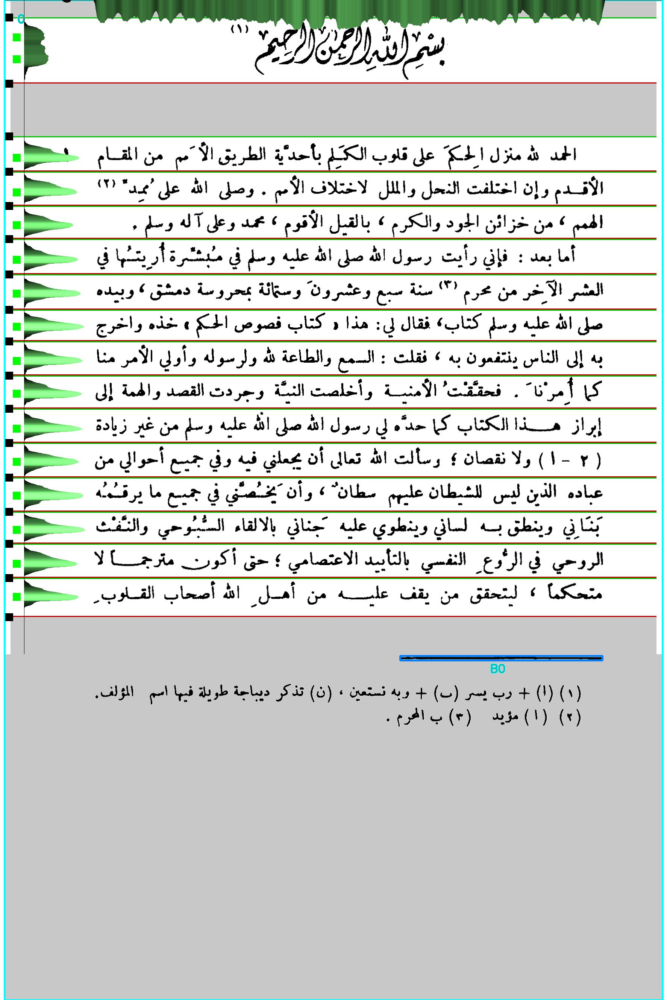

  0.00s Batch of 1 pages: 48
  0.00s Start batch processing images
   |      |      |    2h 05m 27s     1 048.tif                                 
  0.78s all done
  0.78s all done


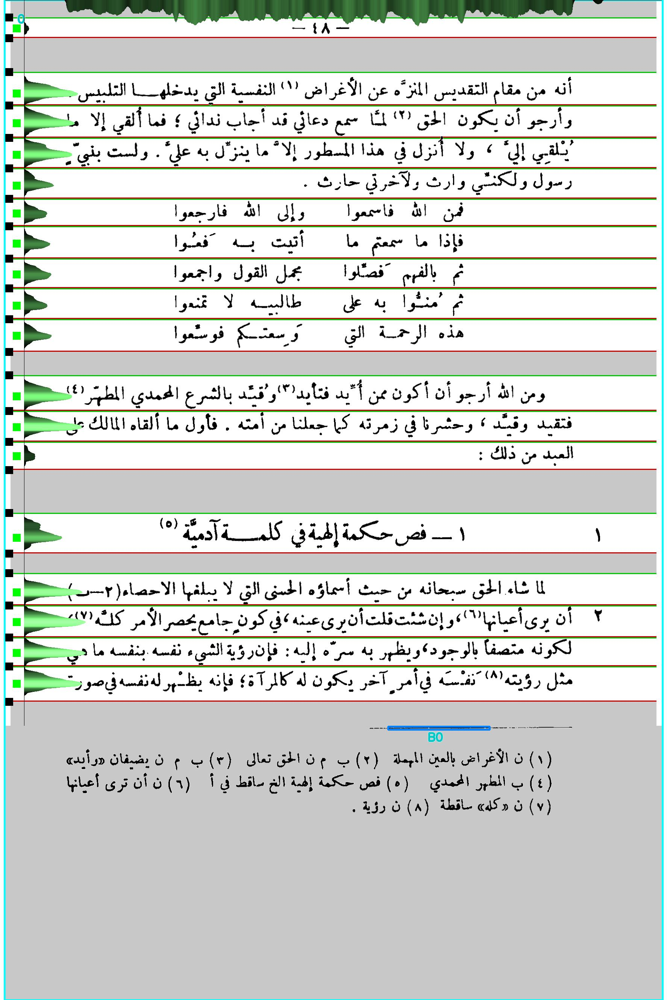

  0.00s Batch of 1 pages: 58
  0.00s Start batch processing images
   |      |      |    2h 05m 28s     1 058.tif                                 
  0.72s all done
  0.72s all done


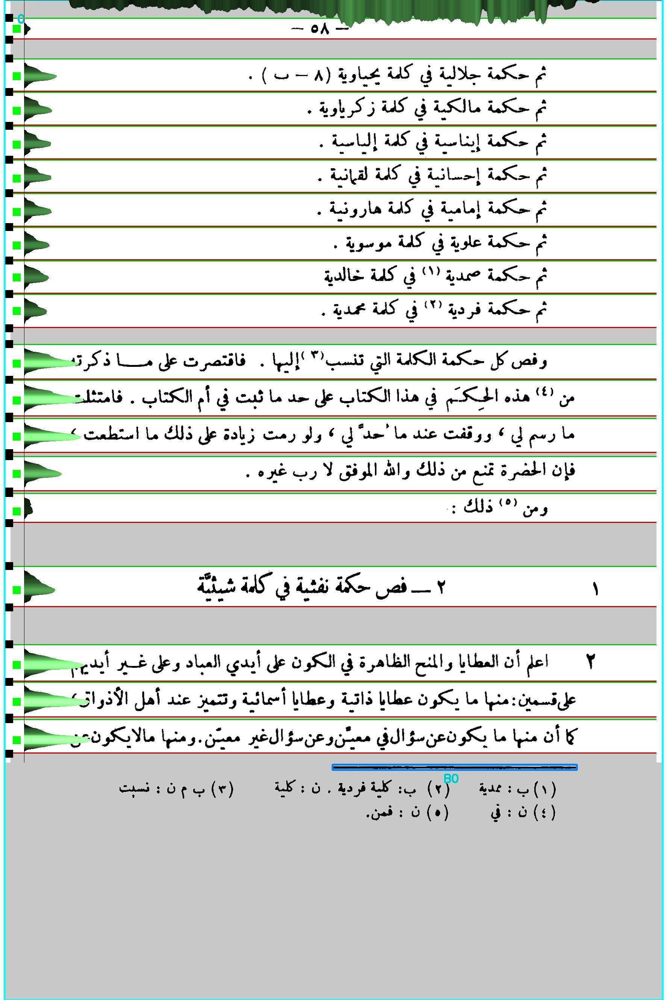

  0.00s Batch of 1 pages: 59
  0.00s Start batch processing images
   |      |      |    2h 05m 29s     1 059.tif                                 
  0.85s all done
  0.85s all done


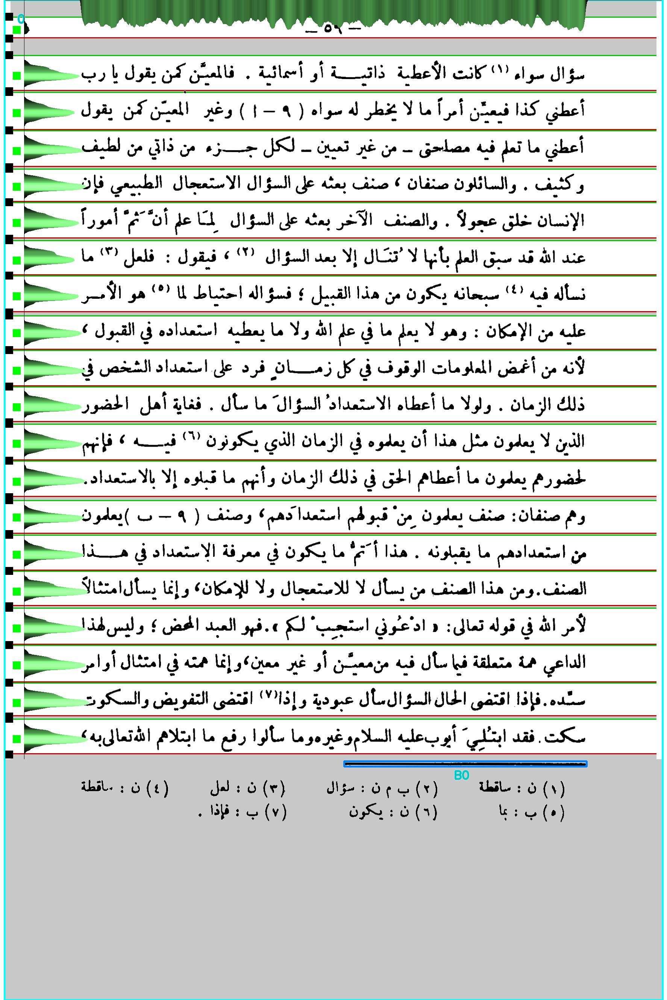

  0.00s Batch of 1 pages: 63
  0.00s Start batch processing images
   |      |      |    2h 05m 30s     1 063.tif                                 
  0.83s all done
  0.83s all done


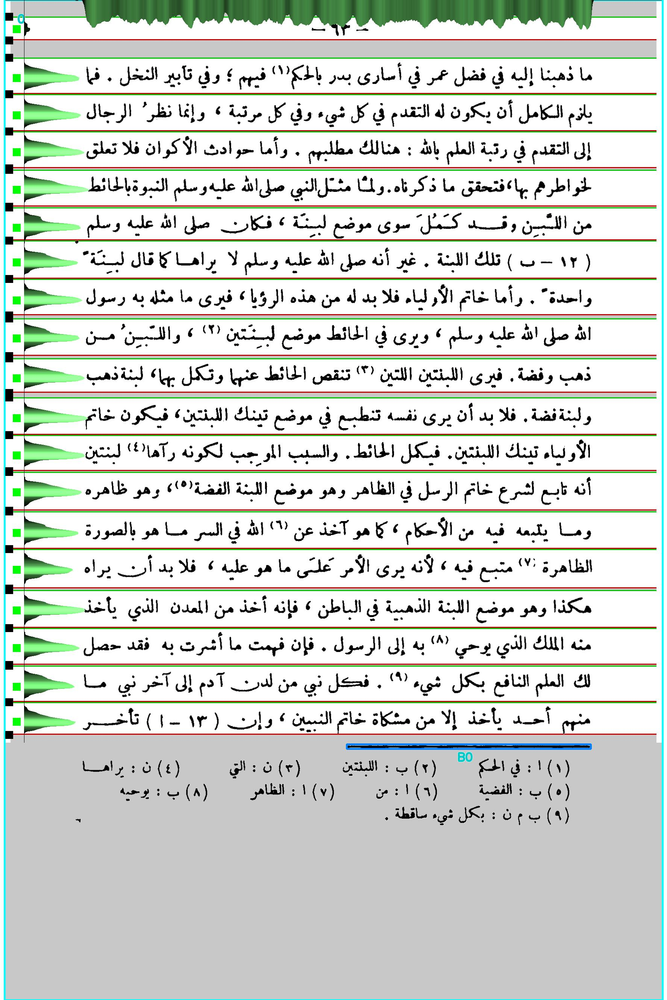

  0.00s Batch of 1 pages: 67
  0.00s Start batch processing images
   |      |      |    2h 05m 30s     1 067.tif                                 
  0.86s all done
  0.86s all done


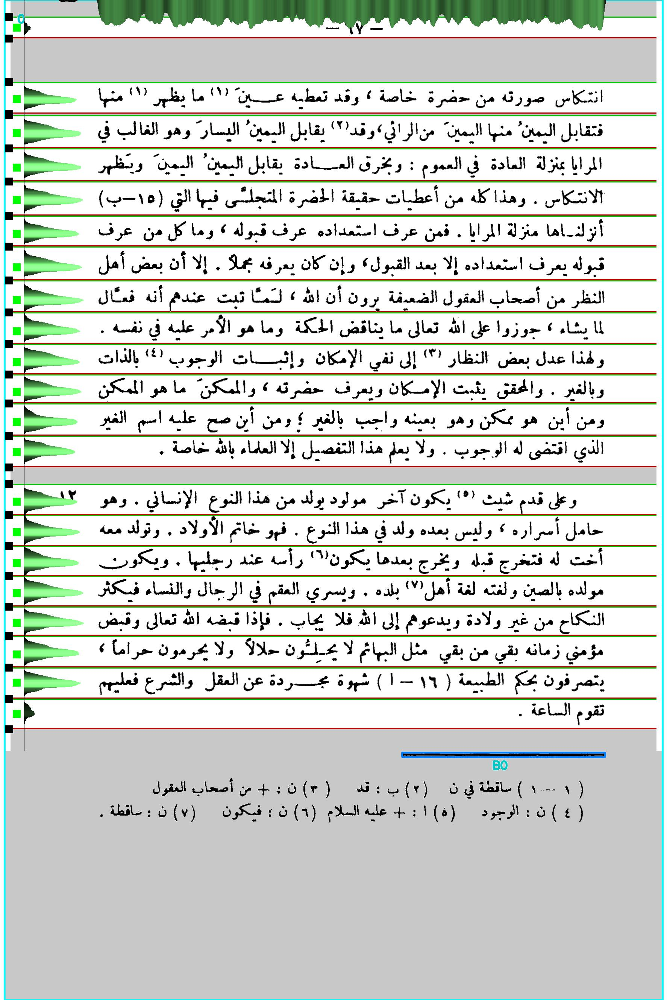

  0.00s Batch of 1 pages: 101
  0.00s Start batch processing images
   |      |      |    2h 05m 31s     1 101.jpg                                 
  0.69s all done
  0.69s all done


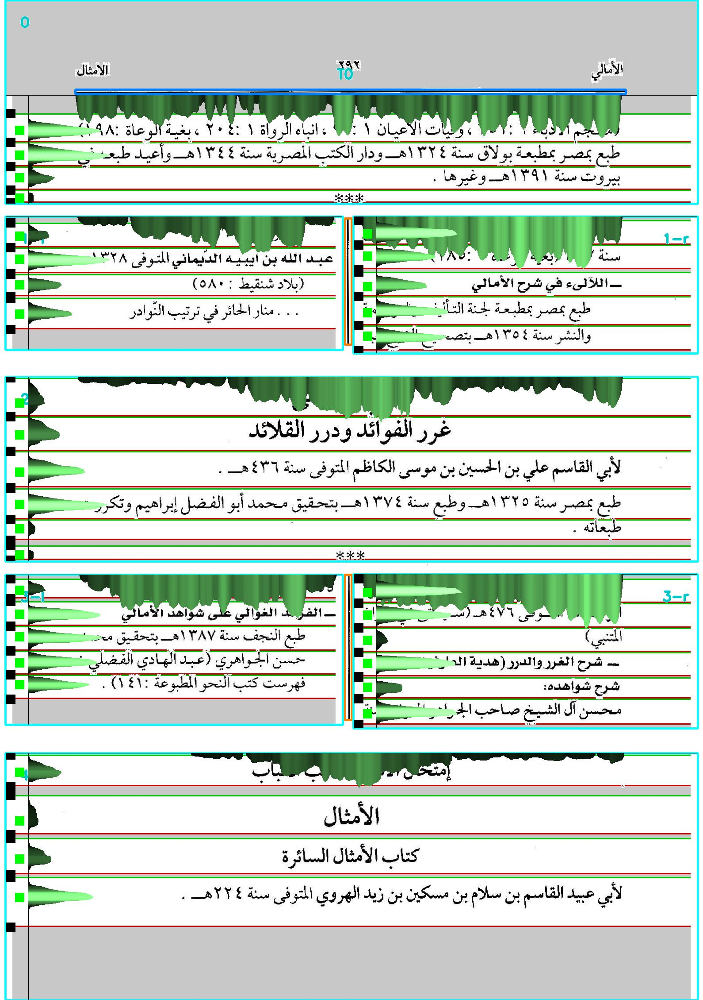

  0.00s Batch of 1 pages: 102
  0.00s Start batch processing images
   |      |      |    2h 05m 32s     1 102.jpg                                 
  0.75s all done
  0.75s all done


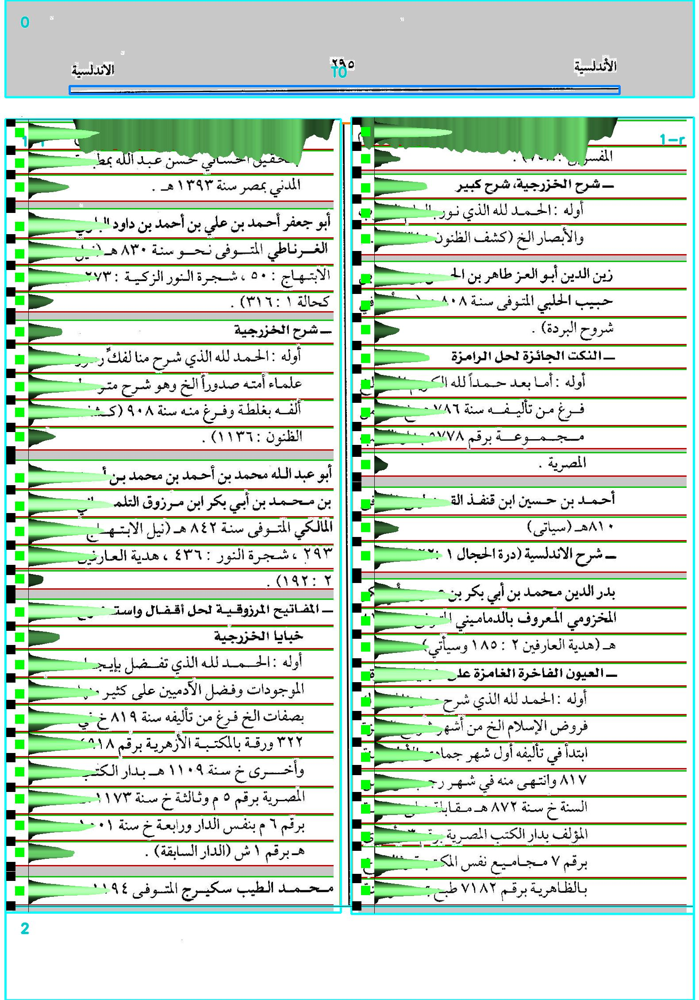

  0.00s Batch of 1 pages: 111
  0.00s Start batch processing images
   |      |      |    2h 05m 34s     1 111.jpg                                 
  1.33s all done
  1.33s all done


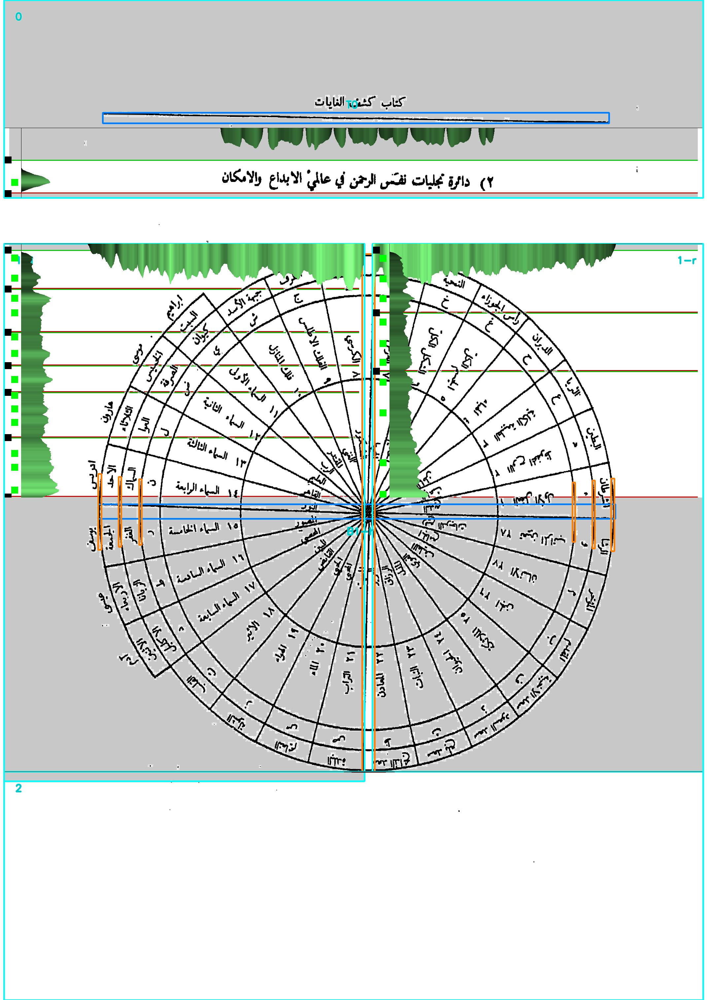

  0.00s Batch of 1 pages: 112
  0.00s Start batch processing images
   |      |      |    2h 05m 35s     1 112.jpg                                 
  1.15s all done
  1.15s all done


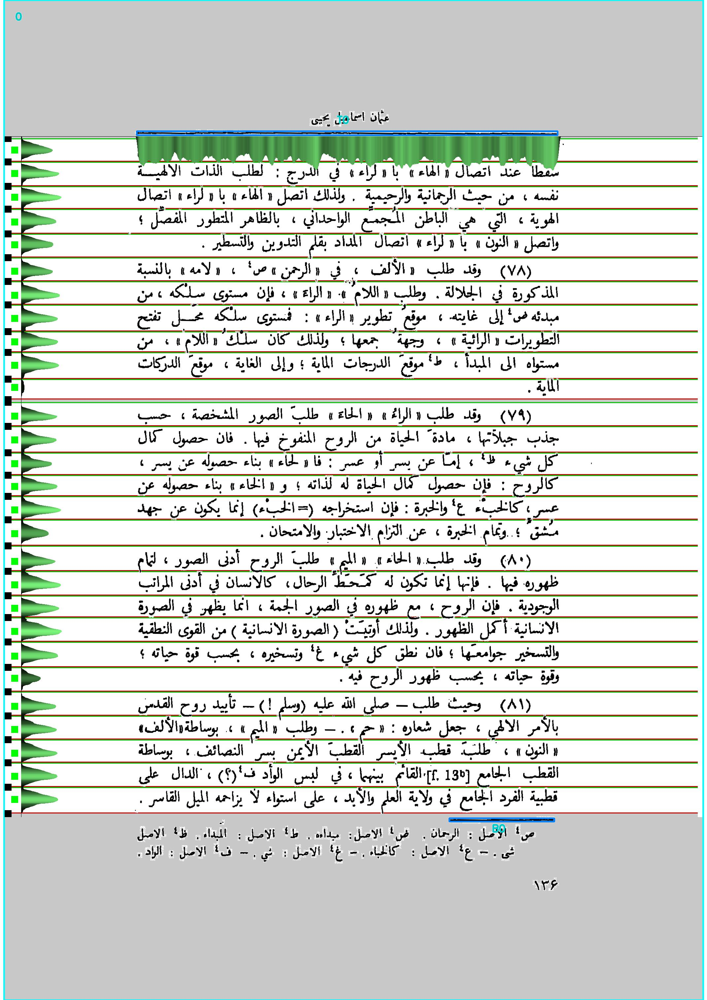

  0.00s Batch of 1 pages: 113
  0.00s Start batch processing images
   |      |      |    2h 05m 36s     1 113.jpg                                 
  1.17s all done
  1.17s all done


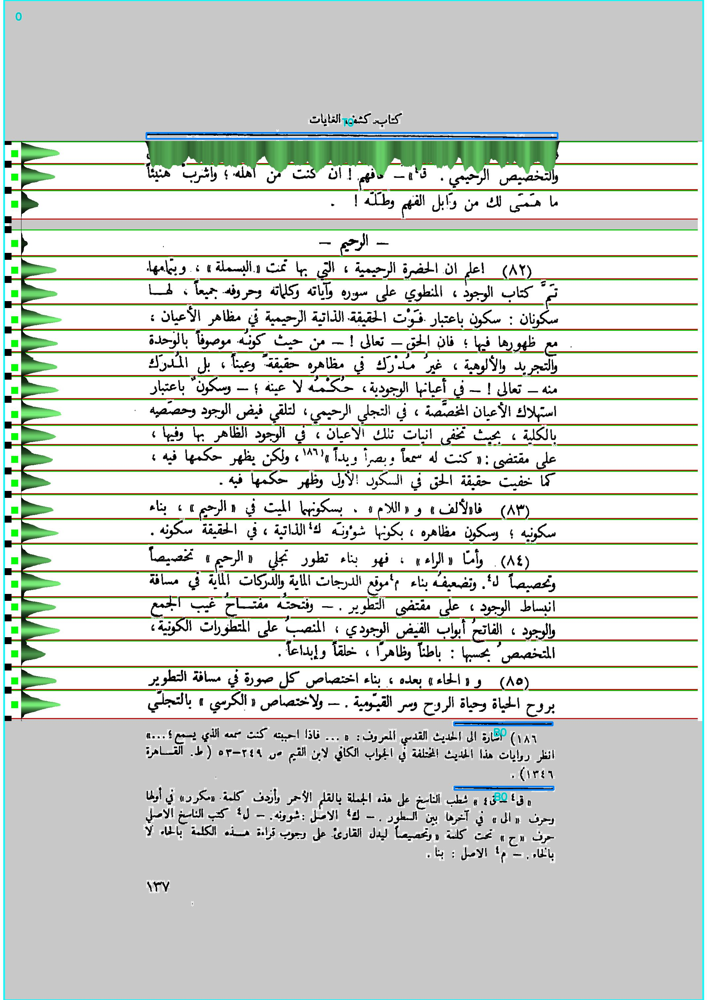

  0.00s Batch of 1 pages: 121
  0.00s Start batch processing images
   |      |      |    2h 05m 37s     1 121.jpg                                 
  0.84s all done
  0.84s all done


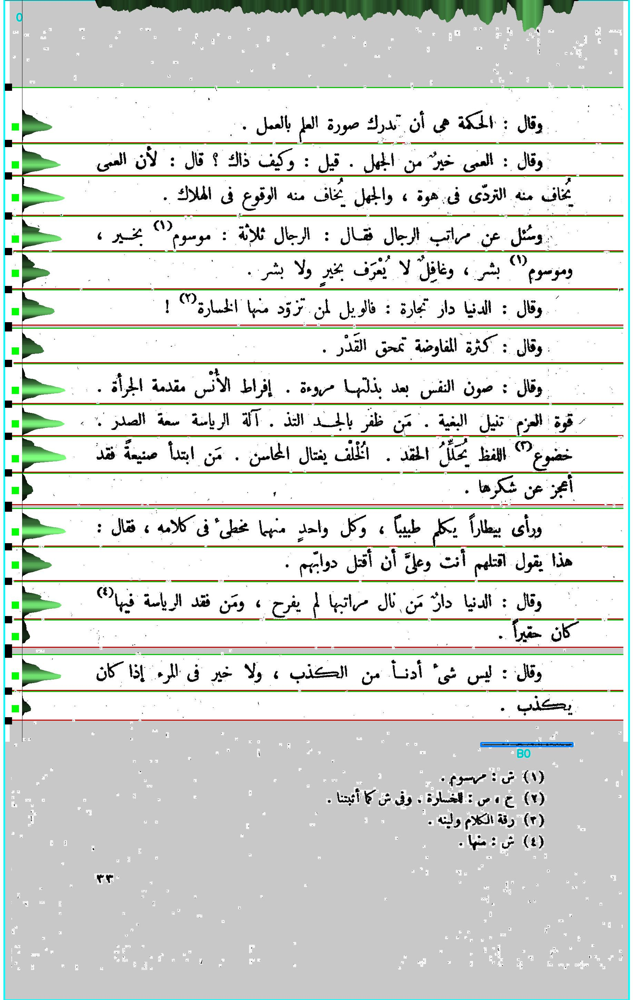

  0.00s Batch of 1 pages: 122
  0.00s Start batch processing images
   |      |      |    2h 05m 38s     1 122.jpg                                 
  1.04s all done
  1.04s all done


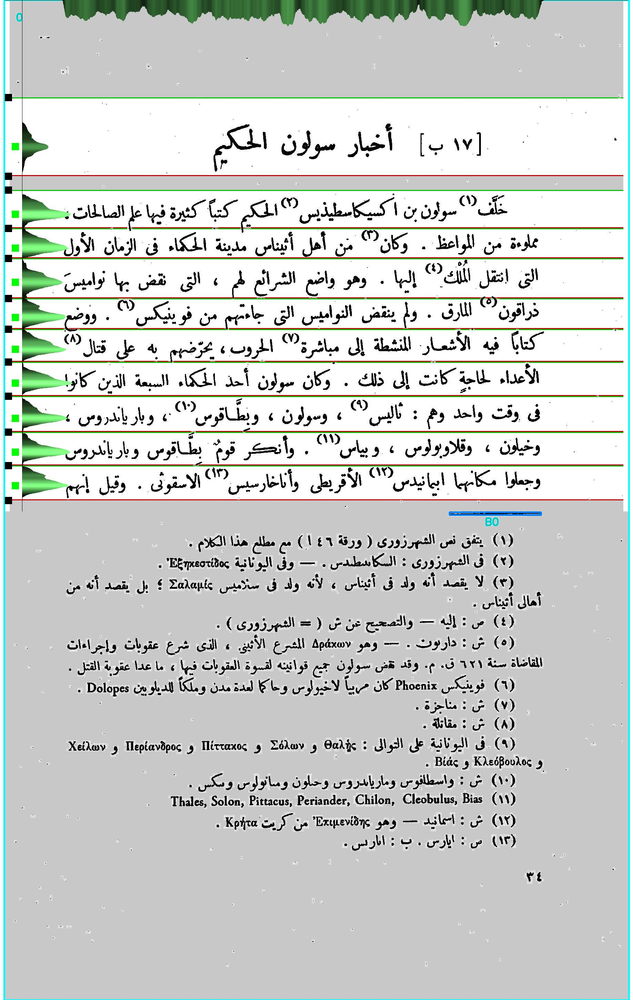

  0.00s Batch of 1 pages: 131
  0.00s Start batch processing images
   |      |      |    2h 05m 40s     1 131.jpg                                 
  1.40s all done
  1.40s all done


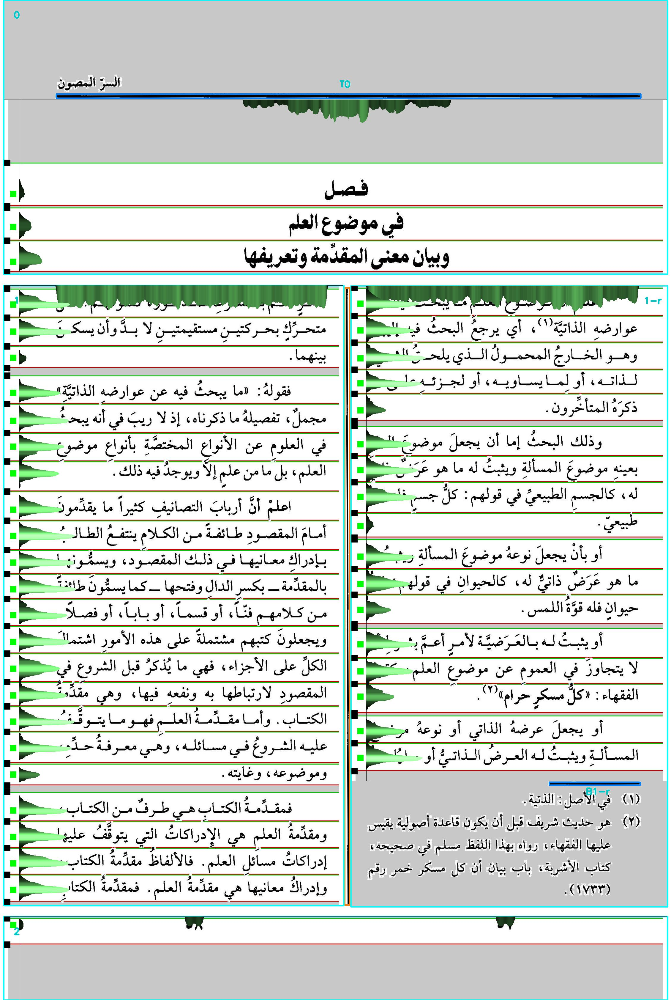

  0.00s Batch of 1 pages: 132
  0.00s Start batch processing images
   |      |      |    2h 05m 41s     1 132.jpg                                 
  1.03s all done
  1.03s all done


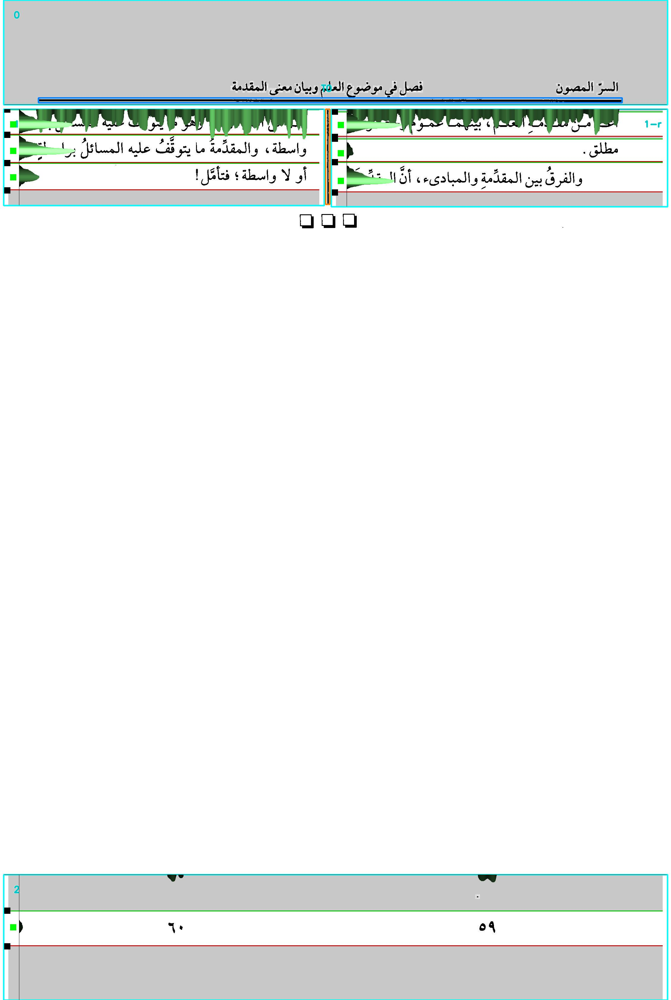

  0.00s Batch of 1 pages: 200
  0.00s Start batch processing images
   |      |      |    2h 05m 44s     1 200.tif                                 
  2.73s all done
  2.74s all done


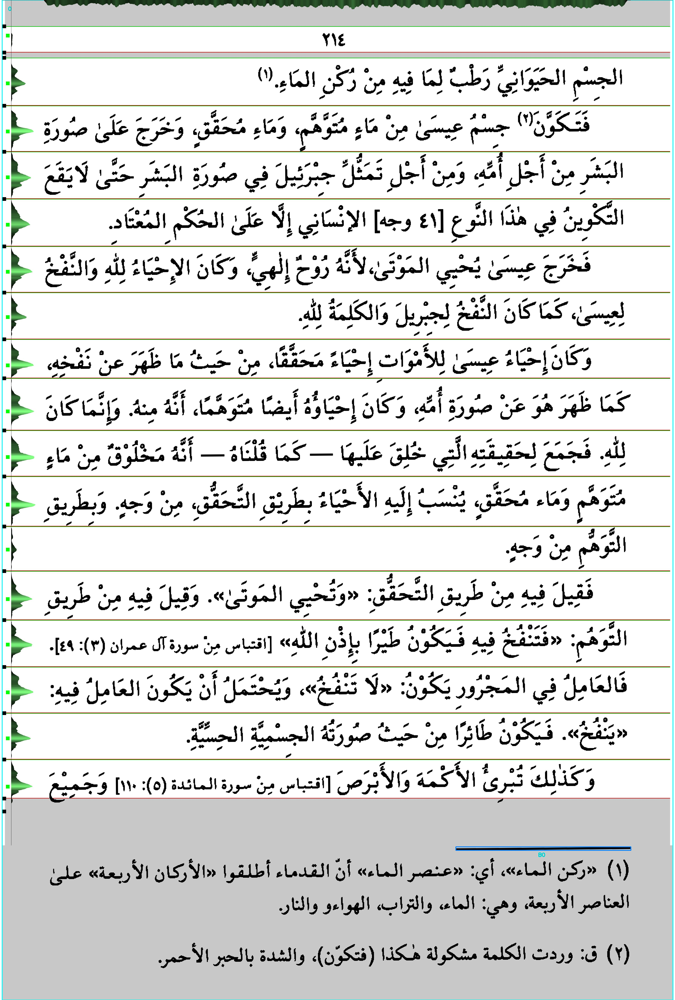

  0.00s Batch of 1 pages: 300
  0.00s Start batch processing images
   |      |      |    2h 05m 47s     1 300.tif                                 
  2.24s all done
  2.24s all done


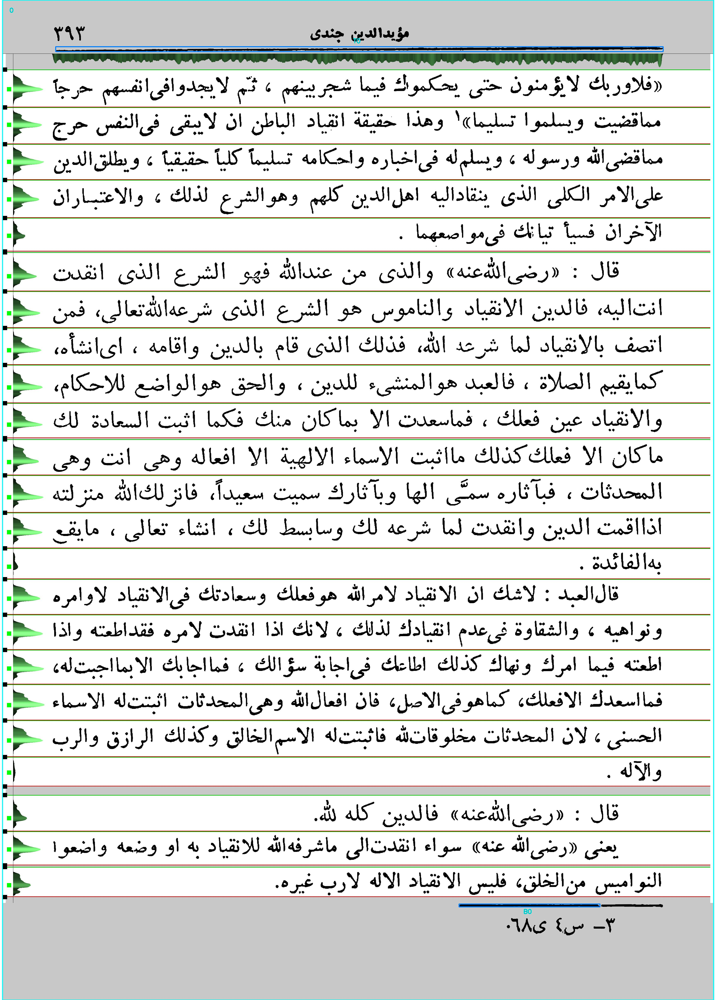

  0.00s Batch of 1 pages: 400
  0.00s Start batch processing images
   |      |      |    2h 05m 50s     1 400.tif                                 
  2.65s all done
  2.65s all done


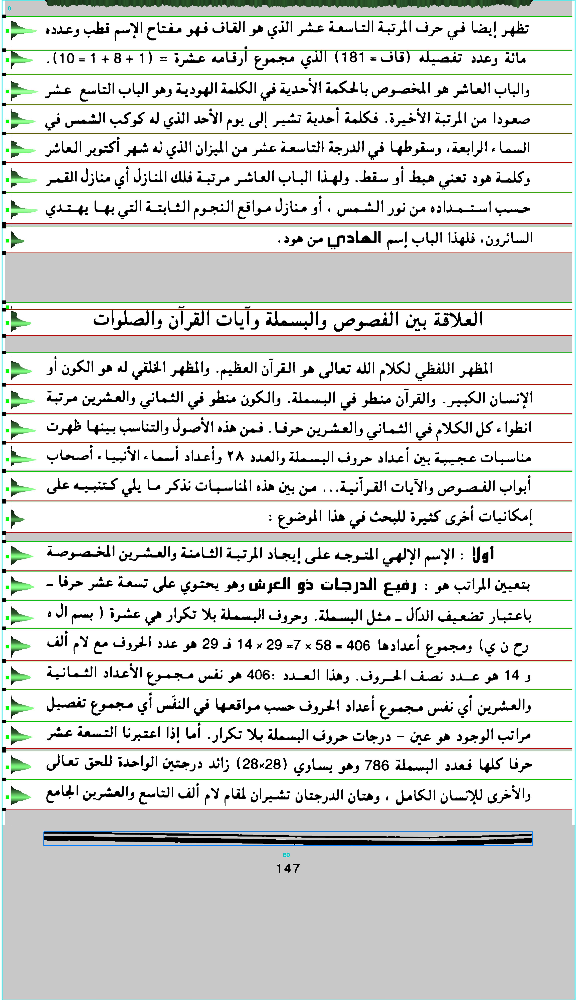

  0.00s Batch of 1 pages: 999
  0.00s Start batch processing images
   |      |      |    2h 05m 50s     1 999.jpg                                 
  0.13s all done
  0.13s all done


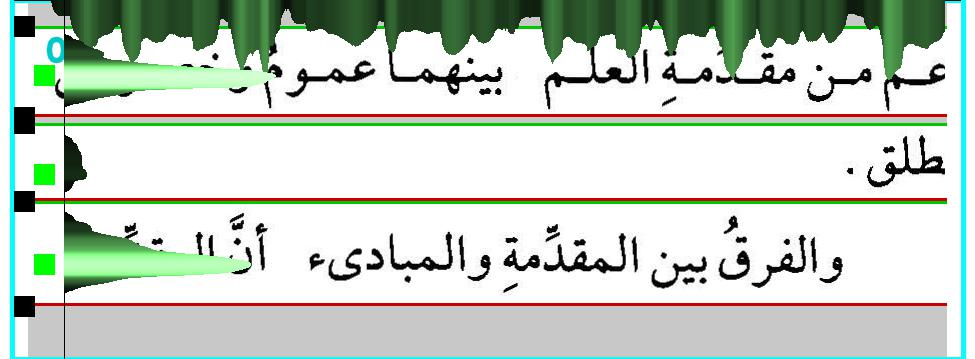

In [212]:
page = checkLines(None)